In [28]:
from lib.knn.__init__ import KNearestNeighbor
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.autograd import Variable
from lib.network import PoseNet, ConfNet, PoseNetRGBOnly
from lib.loss import Loss
from lib.transformations import euler_matrix, quaternion_matrix, quaternion_from_matrix
from datasets.linemod.dataset import PoseDataset as PoseDataset_linemod
import yaml
from PIL import Image
import numpy as np
import warnings
import matplotlib.pyplot as plt
warnings.filterwarnings("ignore")

In [41]:
num_objects = 5
objlist = [2, 4, 5, 10, 11]
num_points = 500
iteration = 4
refine_start = False
bs = 1
dataset_config_dir = 'datasets/linemod/dataset_config'
output_result_dir = 'experiments/eval_result/linemod'
knn = KNearestNeighbor(1)

add_depth_to_output=True
true_depth=False

In [30]:
estimator = PoseNetRGBOnly(num_points = num_points, num_obj = num_objects)
model = 'trained_models/linemod/rgb_model_4_0.010808611272843284.pth'
estimator.load_state_dict(torch.load(model))
estimator.cuda();

In [42]:
estimator = PoseNet(num_points = num_points, num_obj = num_objects)
model = 'trained_models/linemod/pose_model_5_0.03060851228305871.pth'
estimator.load_state_dict(torch.load(model))
estimator.cuda();

In [43]:
dataset_root = "./datasets/linemod/Linemod_preprocessed"


testdataset = PoseDataset_linemod('eval', 
                              num_points, 
                              False, 
                              dataset_root, 
                              0.0, 
                              refine_start,
                              use_true_depth=true_depth,
                              objlist=objlist)
testdataloader = torch.utils.data.DataLoader(testdataset, batch_size=1, shuffle=False, num_workers=4)

Object 2 buffer loaded
Object 4 buffer loaded
Object 5 buffer loaded
Object 10 buffer loaded
Object 11 buffer loaded


In [44]:
sym_list = testdataset.get_sym_list()
num_points_mesh = testdataset.get_num_points_mesh()
criterion = Loss(num_points_mesh, sym_list)

In [45]:
diameter = []
meta_file = open('{0}/models_info.yml'.format(dataset_config_dir), 'r')
meta = yaml.load(meta_file)
for obj in objlist:
    diameter.append(meta[obj]['diameter'] / 1000.0 * 0.1)
print(diameter)

[0.024750624233, 0.017249224865, 0.020140358597000002, 0.016462758847999998, 0.017588933422000002]


In [46]:
success_count = [0 for i in range(num_objects)]
num_count = [0 for i in range(num_objects)]

In [47]:
def plot_points(pred, img_path):
    cam_cx = 325.26110
    cam_cy = 242.04899
    cam_fx = 572.41140
    cam_fy = 573.57043
    cam_scale = 1
    
    predicts = pred * 1000
    x = predicts[:, 0]
    y = predicts[:, 1]
    z = predicts[:, 2]
    
    dep = z * cam_scale
    pixel_x = x * cam_fx / dep + cam_cx
    pixel_y = y * cam_fy / dep + cam_cy

    image = Image.open(img_path)

    plt.figure(figsize=(20,10))
    plt.imshow(image)
    plt.scatter(pixel_x, pixel_y, s=2, c='r')
    plt.show()

No.199 NOT Pass! Distance: 0.05208909418994052


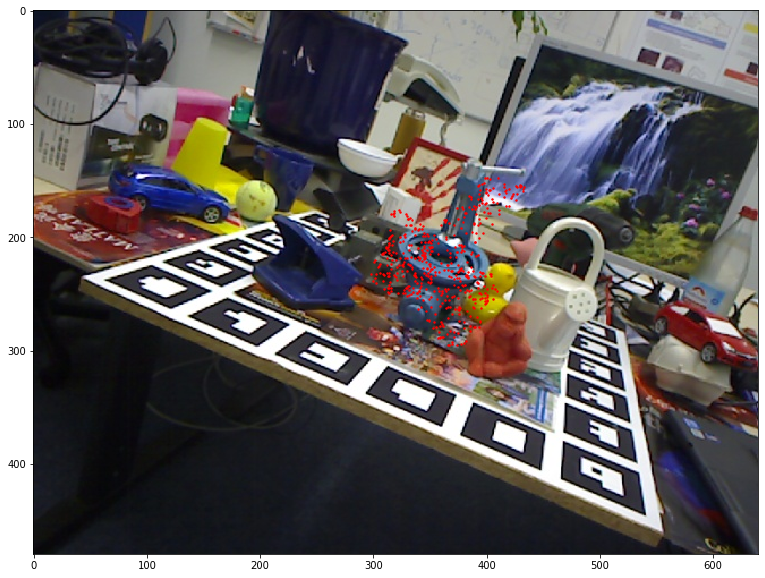

No.399 Pass! Distance: 0.023789296181595743


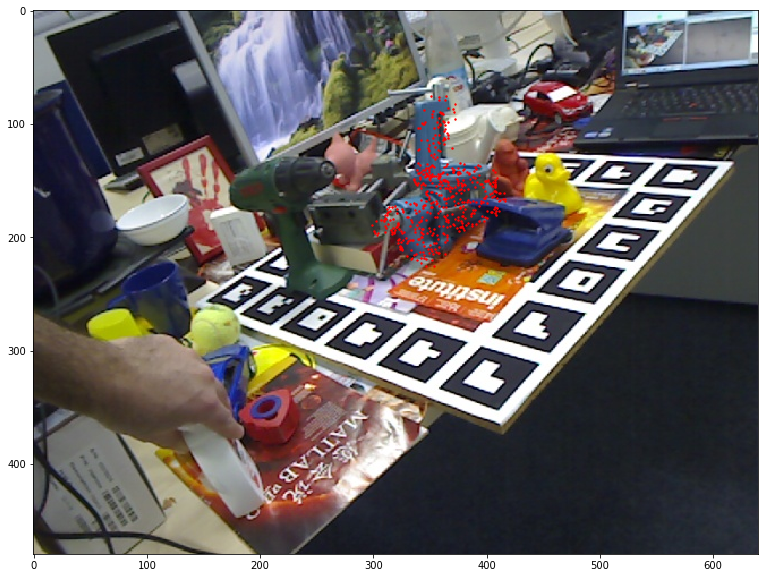

No.599 Pass! Distance: 0.023748732206260968


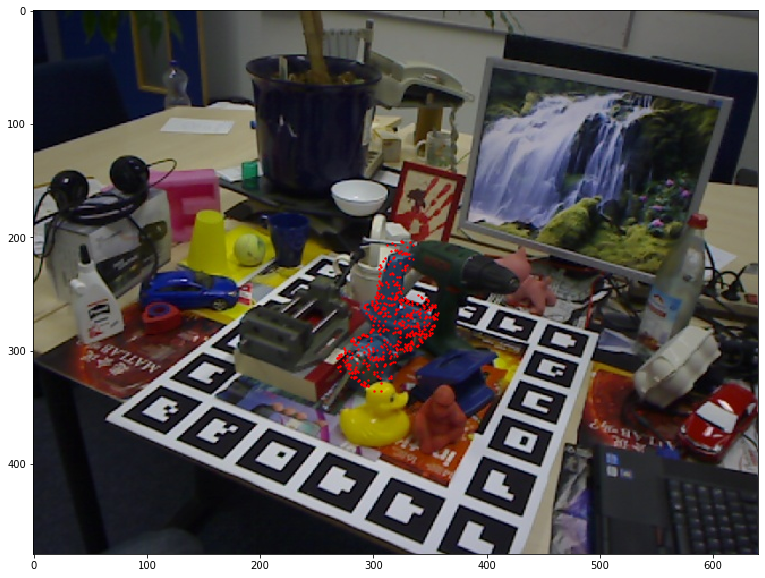

No.799 NOT Pass! Distance: 0.028009282127704826


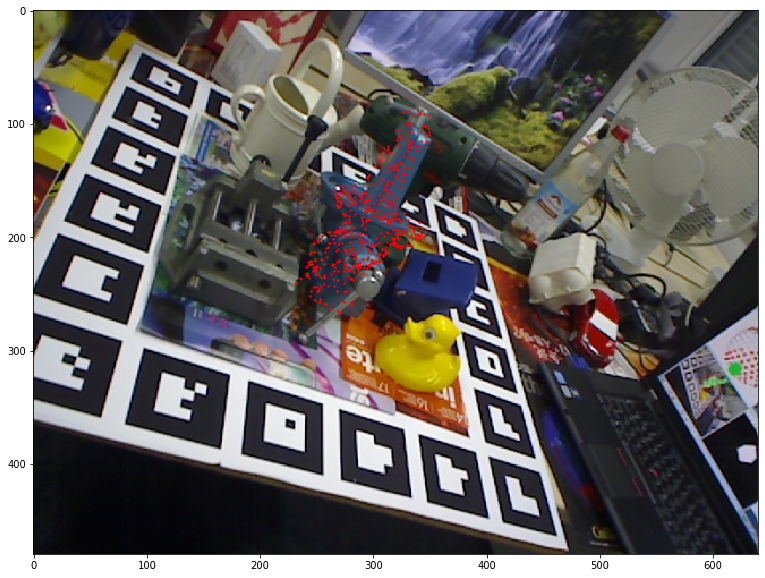

No.999 NOT Pass! Distance: 0.04150172156907907


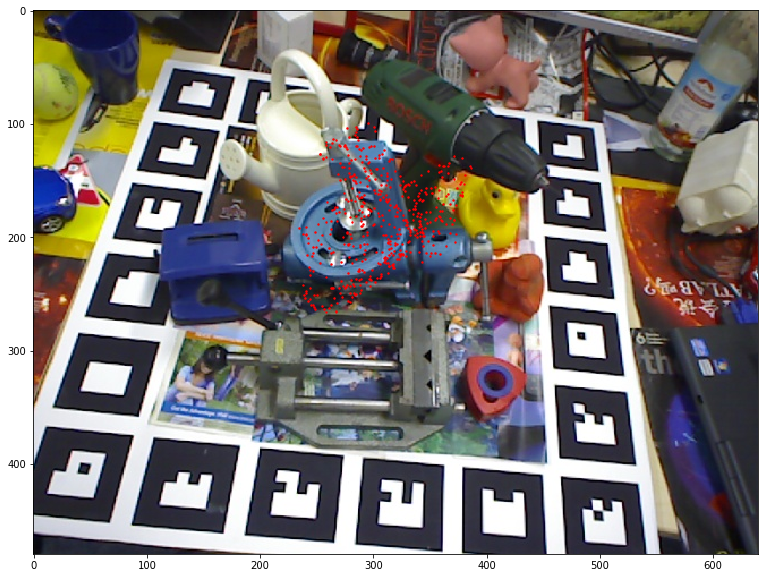

No.1199 NOT Pass! Distance: 0.021325604580069428


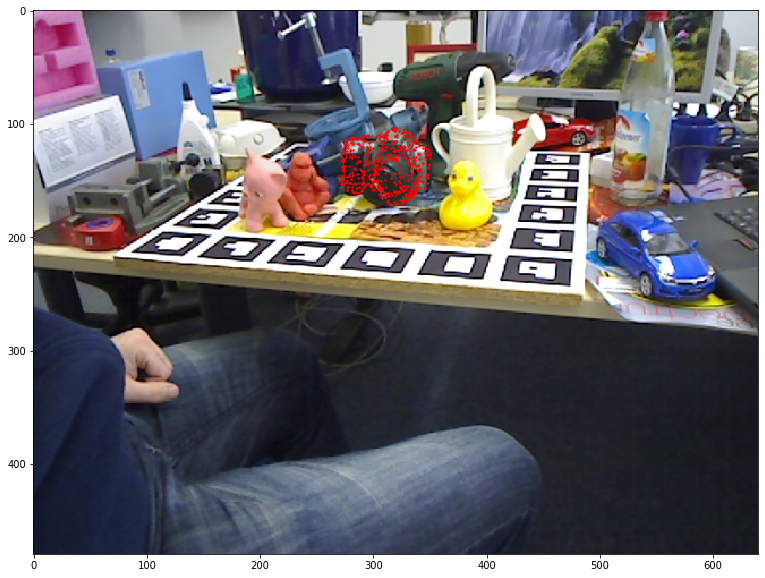

No.1399 NOT Pass! Distance: 0.029926195760417322


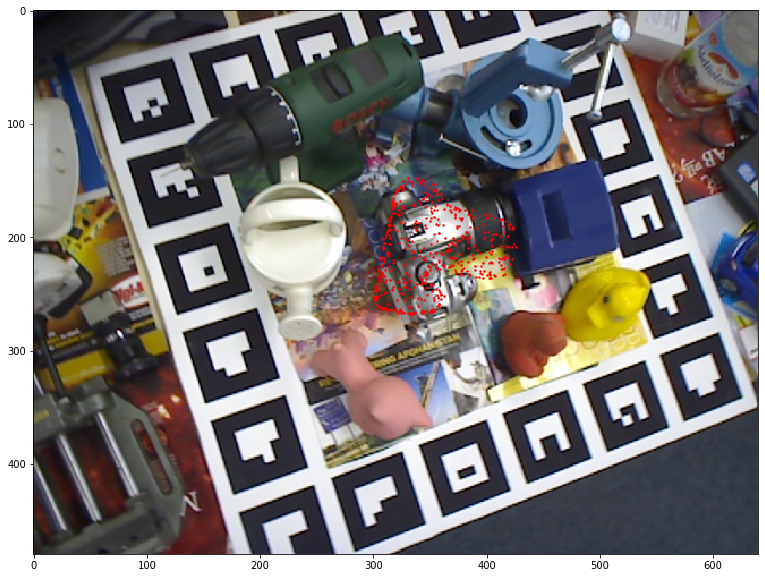

No.1599 NOT Pass! Distance: 0.019771232934708893


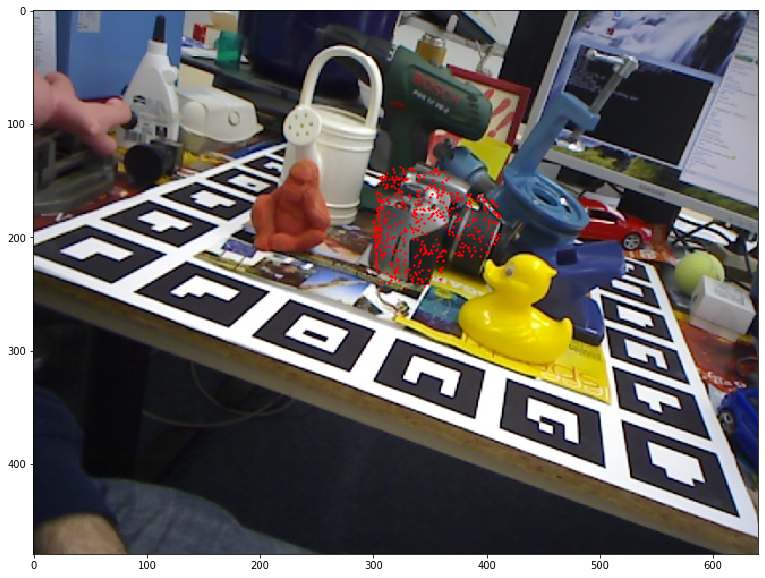

No.1799 NOT Pass! Distance: 0.03875253745211406


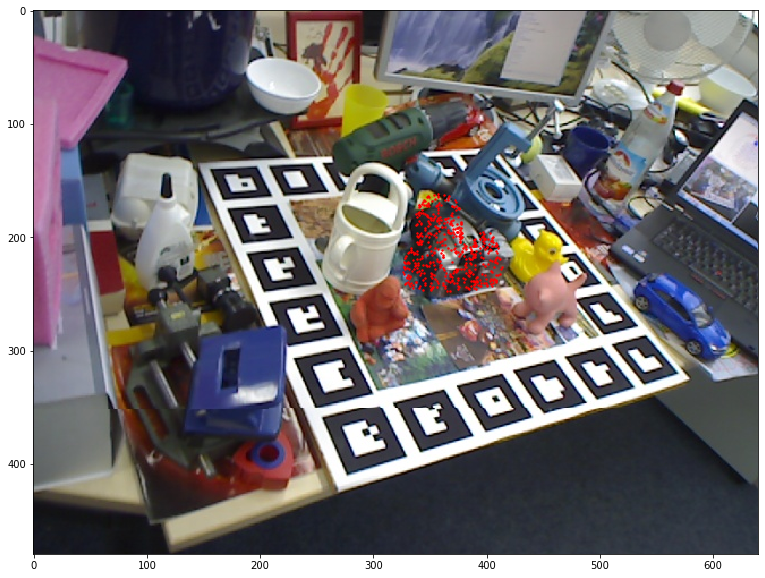

No.1999 NOT Pass! Distance: 0.11408490449528341


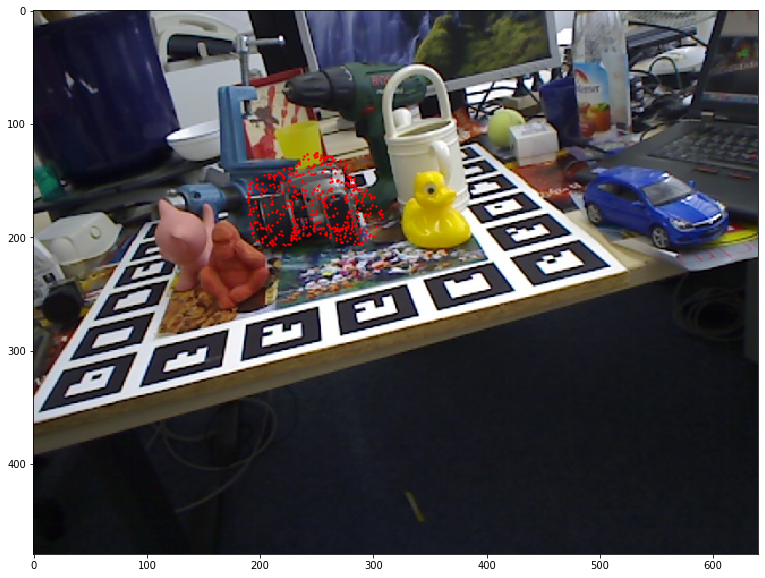

No.2199 NOT Pass! Distance: 0.04421397478524582


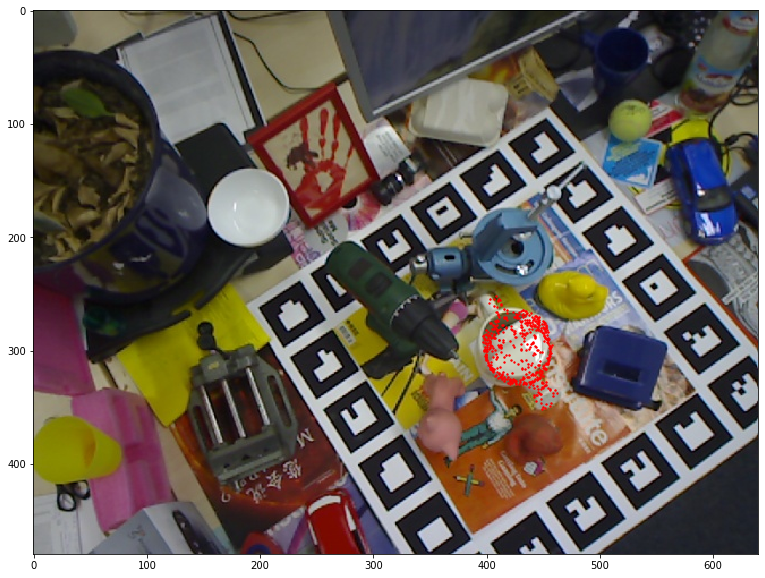

No.2399 NOT Pass! Distance: 0.033221684640629336


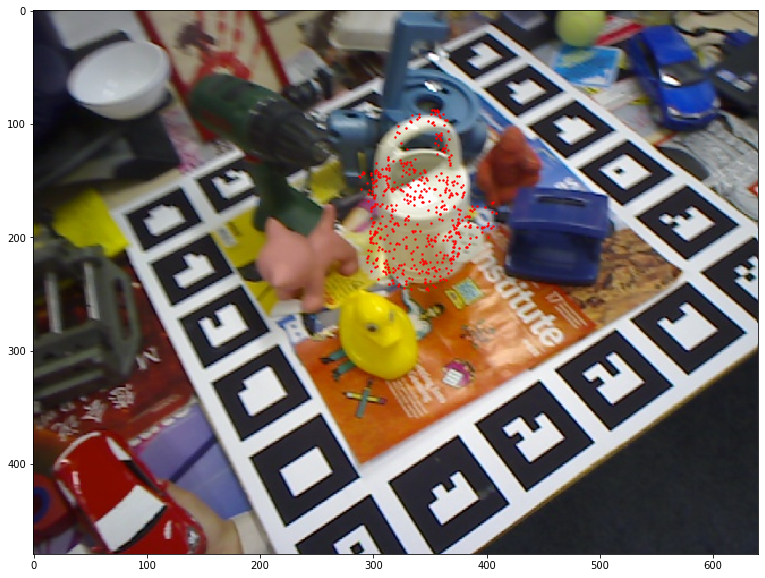

No.2599 NOT Pass! Distance: 0.025948355066590274


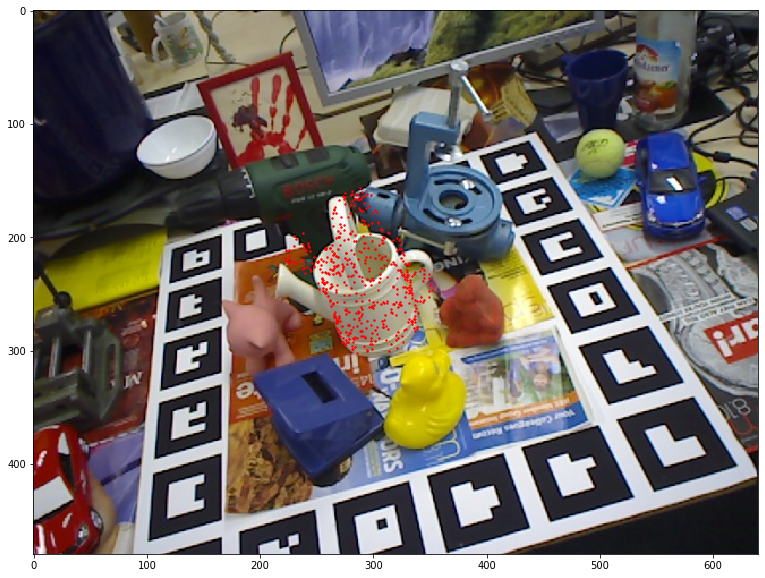

No.2799 NOT Pass! Distance: 0.02771828535930527


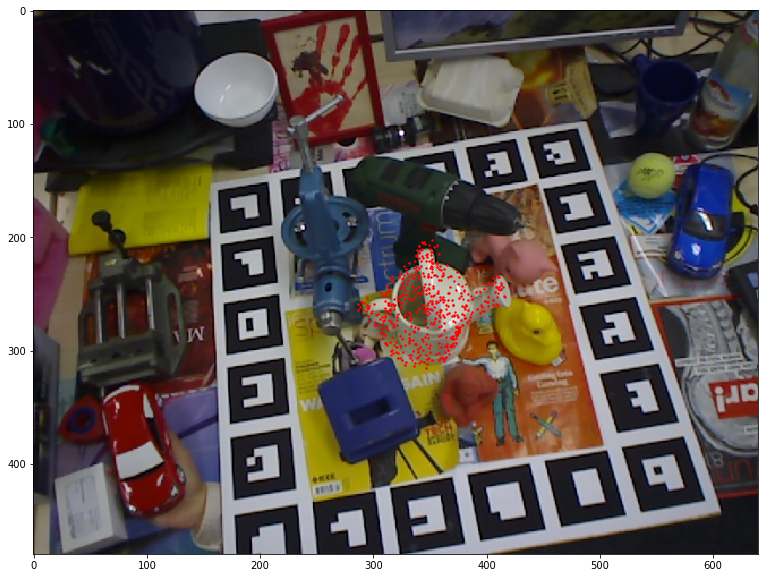

No.2999 NOT Pass! Distance: 0.07937444402068522


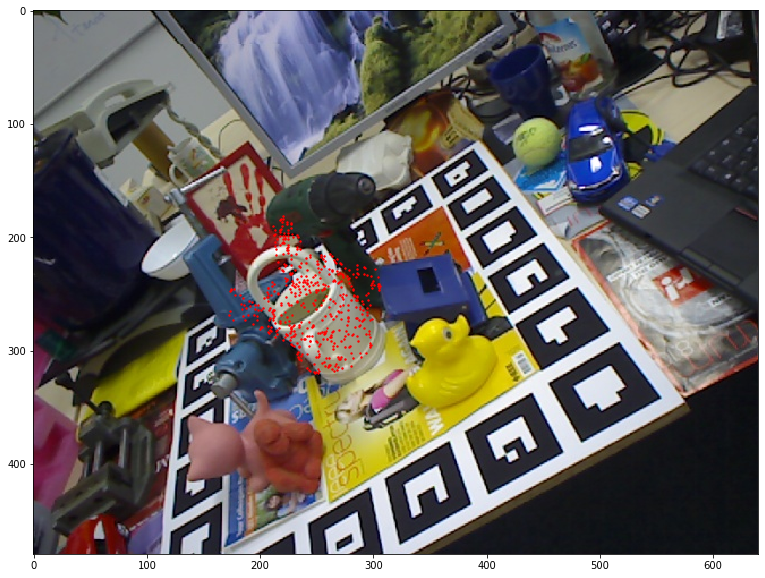

No.3199 Pass! Distance: 0.010655147023499012


TypeError: can't convert CUDA tensor to numpy. Use Tensor.cpu() to copy the tensor to host memory first.

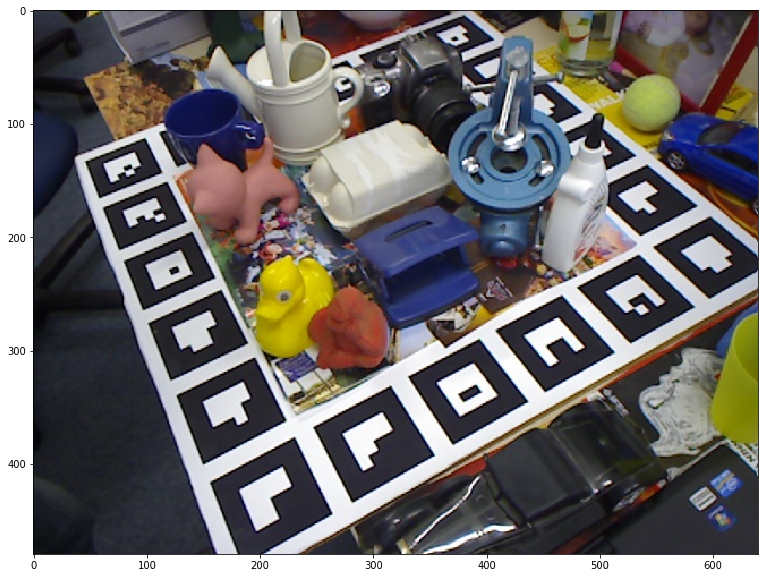

In [49]:
fw = open('{0}/eval_result_logs.txt'.format(output_result_dir), 'w')

for i, data in enumerate(testdataloader, 0):
    points, choose, img, target, model_points, idx = data

    if len(points.size()) == 2:
        print('No.{0} NOT Pass! Lost detection!'.format(i))
        fw.write('No.{0} NOT Pass! Lost detection!\n'.format(i))
        continue
        
#     points[0, :, 2] = 0
    points, choose, img, target, model_points, idx = Variable(points).cuda(), \
                                                     Variable(choose).cuda(), \
                                                     Variable(img).cuda(), \
                                                     Variable(target).cuda(), \
                                                     Variable(model_points).cuda(), \
                                                     Variable(idx).cuda()
    pred_r, pred_t, pred_c, emb = estimator(img, points, choose, idx)
#     pred_r, pred_t, pred_c, emb = estimator(img, choose, idx)
#     pred_loss = confnet(emb)
                
    pred_r = pred_r / torch.norm(pred_r, dim=2).view(1, num_points, 1)
    pred_c = pred_c.view(bs, num_points)
    
    how_max, which_max = torch.max(pred_c, 1)
#     how_min, which_min = torch.min(pred_loss, 1) # The model predict the error of each pixel
   
    pred_t = pred_t.view(bs * num_points, 1, 3)

#     my_r = pred_r[0][which_min[0]].view(-1).cpu().data.numpy()
#     my_t = (points.view(bs * num_points, 1, 3) + pred_t)[which_min[0]].view(-1).cpu().data.numpy()
#     my_pred = np.append(my_r, my_t)
    
    my_r = pred_r[0][which_max[0]].view(-1).cpu().data.numpy()
    my_t = (points.view(bs * num_points, 1, 3) + pred_t)[which_max[0]].view(-1).cpu().data.numpy()
    my_pred = np.append(my_r, my_t)

    
    # Here 'my_pred' is the final pose estimation result ('my_r': quaternion, 'my_t': translation)
    
    model_points = model_points[0].cpu().detach().numpy()
    my_r = quaternion_matrix(my_r)[:3, :3]
    pred = np.dot(model_points, my_r.T) + my_t
    target = target[0].cpu().detach().numpy()
    
    
    
    if idx[0].item() in sym_list:
        pred = torch.from_numpy(pred.astype(np.float32)).cuda().transpose(1, 0).contiguous()
        target = torch.from_numpy(target.astype(np.float32)).cuda().transpose(1, 0).contiguous()
        inds = knn(target.unsqueeze(0), pred.unsqueeze(0))
        target = torch.index_select(target, 1, inds.view(-1) - 1)
        dis = torch.mean(torch.norm((pred.transpose(1, 0) - target.transpose(1, 0)), dim=1), dim=0).item()
    else:
        dis = np.mean(np.linalg.norm(pred - target, axis=1))
    
    if dis < diameter[idx[0].item()]:
        success_count[idx[0].item()] += 1
#         print('No.{0} Pass! Distance: {1}'.format(i, dis))
        fw.write('No.{0} Pass! Distance: {1}\n'.format(i, dis))
    else:
#         print('No.{0} NOT Pass! Distance: {1}'.format(i, dis))
        fw.write('No.{0} NOT Pass! Distance: {1}\n'.format(i, dis))
    num_count[idx[0].item()] += 1
    
    
    
    
    if (i + 1) % 200 == 0:
        if dis < diameter[idx[0].item()]:
            success_count[idx[0].item()] += 1
            print('No.{0} Pass! Distance: {1}'.format(i, dis))
        else:
            print('No.{0} NOT Pass! Distance: {1}'.format(i, dis))
            
        num_count[idx[0].item()] += 1
        plot_points(pred, testdataset.list_rgb[i])
    
for i in range(num_objects):
    print('Object {0} success rate: {1}'.format(objlist[i], float(success_count[i]) / num_count[i]))
    fw.write('Object {0} success rate: {1}\n'.format(objlist[i], float(success_count[i]) / num_count[i]))
print('ALL success rate: {0}'.format(float(sum(success_count)) / sum(num_count)))
fw.write('ALL success rate: {0}\n'.format(float(sum(success_count)) / sum(num_count)))
fw.close()





- 2: "Bench Vise"
- 4: "camera"
- 5: "can"
- 6: "cat"
- 10: "eggbox"

In [37]:
target = target * 1000
x = target[:, 0]
y = target[:, 1]
z = target[:, 2]
depth = z * cam_scale
pixel_x = x * cam_fx / depth + cam_cx
pixel_y = y * cam_fy / depth + cam_cy

img = Image.open(testdataset.list_rgb[idx])

plt.figure(figsize=(20,10))
plt.imshow(img)
plt.scatter(pixel_x, pixel_y, s=2, c='r')